In [48]:
#libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

In [50]:
# fetching data from computer 
import pandas as pd
traindata=pd.read_excel(r"C:\Users\malik\Downloads\Flight_Ticket_Participant_Datasets-20190305T100527Z-001\Flight_Ticket_Participant_Datasets\Data_Train flight.xlsx")
traindata.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302


In [49]:
# fetching data from computer 
import pandas as pd
testdata=pd.read_excel(r"C:\Users\malik\Downloads\Flight_Ticket_Participant_Datasets-20190305T100527Z-001\Flight_Ticket_Participant_Datasets\Test_set.xlsx")
testdata.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info
0,Jet Airways,6/06/2019,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info
1,IndiGo,12/05/2019,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info
2,Jet Airways,21/05/2019,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included
3,Multiple carriers,21/05/2019,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info
4,Air Asia,24/06/2019,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info


In [51]:
# To fetch the details of rows
pd.set_option('display.max_rows',None)

In [52]:
# To fetch the detail of rows and coloumns
testdata.shape

(2671, 10)

In [53]:
traindata.shape

(10683, 11)

In [54]:
# To fetch the details of columns 
traindata.columns

Index(['Airline', 'Date_of_Journey', 'Source', 'Destination', 'Route',
       'Dep_Time', 'Arrival_Time', 'Duration', 'Total_Stops',
       'Additional_Info', 'Price'],
      dtype='object')

In [55]:
# To fetch the details of columns 
testdata.columns

Index(['Airline', 'Date_of_Journey', 'Source', 'Destination', 'Route',
       'Dep_Time', 'Arrival_Time', 'Duration', 'Total_Stops',
       'Additional_Info'],
      dtype='object')

In [56]:
# To fetching the datatypes of the columns
traindata.dtypes

Airline            object
Date_of_Journey    object
Source             object
Destination        object
Route              object
Dep_Time           object
Arrival_Time       object
Duration           object
Total_Stops        object
Additional_Info    object
Price               int64
dtype: object

In [57]:
# To fetching the datatypes of the columns
testdata.dtypes

Airline            object
Date_of_Journey    object
Source             object
Destination        object
Route              object
Dep_Time           object
Arrival_Time       object
Duration           object
Total_Stops        object
Additional_Info    object
dtype: object

In [58]:
# Here we are getting details of the data like null values
traindata.isna().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              1
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        1
Additional_Info    0
Price              0
dtype: int64

In [173]:
traindata.describe()

,Airline,Source,Destination,Total_Stops,Price,journeyday,jouourneymonth,dep_hour,dep_min,Arrival_hour,Arrival_min
count,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000
mean,7.021251,1.300599,1.309867,0.824190,9087.214567,12.682925,5.534731,12.491013,24.409287,13.349186,24.690601
std,2.838244,0.982945,1.604119,0.675229,4611.548810,8.803800,2.987626,5.748820,18.767801,6.859317,16.506808
min,0.000000,0.000000,0.000000,0.000000,1759.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,4.000000,1.000000,0.000000,0.000000,5277.000000,5.000000,3.000000,8.000000,5.000000,8.000000,10.000000
50%,9.000000,1.000000,1.000000,1.000000,8372.000000,6.000000,5.000000,11.000000,25.000000,14.000000,25.000000
75%,9.000000,2.000000,2.000000,1.000000,12373.000000,21.000000,6.000000,18.000000,40.000000,19.000000,35.000000
max,11.000000,4.000000,5.000000,4.000000,79512.000000,27.000000,12.000000,23.000000,55.000000,23.000000,55.000000


In [174]:
testdata.describe()

,Airline,Source,Destination,Total_Stops,journeyday,jouourneymonth,dep_hour,dep_min,arrivalhour,arrivalmin
count,2671.000000,2671.000000,2671.000000,2671.000000,2671.000000,2671.000000,2671.000000,2671.000000,2671.000000,2671.000000
mean,2.948708,1.536129,2.723699,0.833396,12.026956,5.607263,12.603519,24.891426,13.585174,24.558218
std,2.666056,1.685615,1.441505,0.672315,8.564408,3.042952,5.686673,19.086522,7.040396,16.775436
min,0.000000,0.000000,0.000000,0.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,2.000000,0.000000,5.000000,3.000000,8.000000,5.000000,8.000000,10.000000
50%,2.000000,1.000000,3.000000,1.000000,6.000000,5.000000,12.000000,25.000000,15.000000,25.000000
75%,3.000000,4.000000,4.000000,1.000000,21.000000,6.000000,18.000000,45.000000,19.000000,35.000000
max,10.000000,4.000000,5.000000,4.000000,27.000000,12.000000,23.000000,55.000000,23.000000,55.000000


In [175]:
# To fetching the datatypes of the columns
traindata.dtypes

Airline           float64
Source            float64
Destination       float64
Total_Stops         int64
Price               int64
journeyday          int64
jouourneymonth      int64
dep_hour            int64
dep_min             int64
Arrival_hour        int64
Arrival_min         int64
dtype: object

In [176]:
# To fetching the datatypes of the columns
testdata.dtypes

Airline           float64
Source            float64
Destination       float64
Total_Stops         int64
journeyday          int64
jouourneymonth      int64
dep_hour            int64
dep_min             int64
arrivalhour         int64
arrivalmin          int64
dtype: object

In [59]:
traindata.dropna()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302
5,SpiceJet,24/06/2019,Kolkata,Banglore,CCU → BLR,09:00,11:25,2h 25m,non-stop,No info,3873
6,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,18:55,10:25 13 Mar,15h 30m,1 stop,In-flight meal not included,11087
7,Jet Airways,01/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:00,05:05 02 Mar,21h 5m,1 stop,No info,22270
8,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:55,10:25 13 Mar,25h 30m,1 stop,In-flight meal not included,11087
9,Multiple carriers,27/05/2019,Delhi,Cochin,DEL → BOM → COK,11:25,19:15,7h 50m,1 stop,No info,8625


In [60]:
# Here we are getting details of the data like null values
testdata.isna().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              0
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        0
Additional_Info    0
dtype: int64

[Text(0, 0, 'IndiGo'),
 Text(1, 0, 'Air India'),
 Text(2, 0, 'Jet Airways'),
 Text(3, 0, 'SpiceJet'),
 Text(4, 0, 'Multiple carriers'),
 Text(5, 0, 'GoAir'),
 Text(6, 0, 'Vistara'),
 Text(7, 0, 'Air Asia'),
 Text(8, 0, 'Vistara Premium economy'),
 Text(9, 0, 'Jet Airways Business'),
 Text(10, 0, 'Multiple carriers Premium economy'),
 Text(11, 0, 'Trujet')]

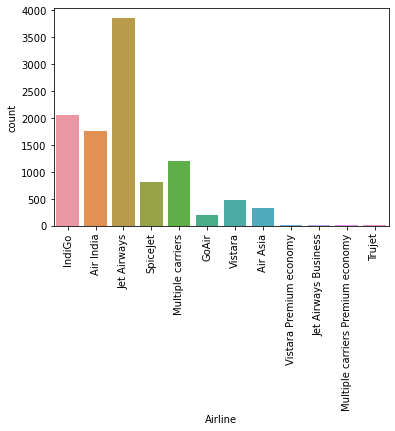

In [61]:
chart=sns.countplot(x='Airline',data=traindata)
chart.set_xticklabels(chart.get_xticklabels(), rotation=90)

[Text(0, 0, 'IndiGo'),
 Text(1, 0, 'Air India'),
 Text(2, 0, 'Jet Airways'),
 Text(3, 0, 'SpiceJet'),
 Text(4, 0, 'Multiple carriers'),
 Text(5, 0, 'GoAir'),
 Text(6, 0, 'Vistara'),
 Text(7, 0, 'Air Asia'),
 Text(8, 0, 'Vistara Premium economy'),
 Text(9, 0, 'Jet Airways Business'),
 Text(10, 0, 'Multiple carriers Premium economy'),
 Text(11, 0, 'Trujet')]

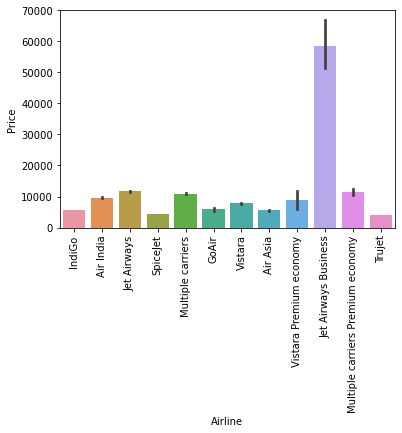

In [62]:
chart=sns.barplot(x='Airline',y='Price',data=traindata)

chart.set_xticklabels(chart.get_xticklabels(), rotation=90)

[Text(0, 0, 'IndiGo'),
 Text(1, 0, 'Air India'),
 Text(2, 0, 'Jet Airways'),
 Text(3, 0, 'SpiceJet'),
 Text(4, 0, 'Multiple carriers'),
 Text(5, 0, 'GoAir'),
 Text(6, 0, 'Vistara'),
 Text(7, 0, 'Air Asia'),
 Text(8, 0, 'Vistara Premium economy'),
 Text(9, 0, 'Jet Airways Business'),
 Text(10, 0, 'Multiple carriers Premium economy'),
 Text(11, 0, 'Trujet')]

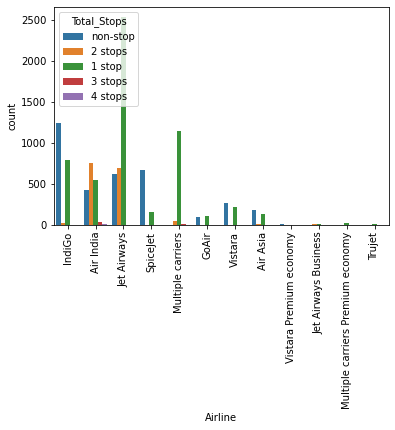

In [63]:
chart=sns.countplot(x='Airline',hue='Total_Stops',data=traindata)
chart.set_xticklabels(chart.get_xticklabels(), rotation=90)

In [64]:
traindata['journeyday'] = pd.DatetimeIndex(traindata['Date_of_Journey']).day
traindata['jouourneymonth'] = pd.DatetimeIndex(traindata['Date_of_Journey']).month

In [65]:
traindata.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,journeyday,jouourneymonth
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897,24,3
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662,5,1
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882,6,9
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218,5,12
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302,3,1


In [66]:
traindata['dep_hour']=pd.to_datetime(traindata['Dep_Time']).dt.hour
traindata['dep_min']=pd.to_datetime(traindata['Dep_Time']).dt.minute

In [67]:
traindata['Arrival_hour']=pd.to_datetime(traindata['Arrival_Time']).dt.hour
traindata['Arrival_min']=pd.to_datetime(traindata['Arrival_Time']).dt.minute

In [68]:
traindata.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,journeyday,jouourneymonth,dep_hour,dep_min,Arrival_hour,Arrival_min
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897,24,3,22,20,1,10
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662,5,1,5,50,13,15
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882,6,9,9,25,4,25
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218,5,12,18,5,23,30
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302,3,1,16,50,21,35


In [69]:
testdata['journeyday'] = pd.DatetimeIndex(testdata['Date_of_Journey']).day
testdata['jouourneymonth'] = pd.DatetimeIndex(testdata['Date_of_Journey']).month

In [70]:
testdata['dep_hour']=pd.to_datetime(testdata['Dep_Time']).dt.hour
testdata['dep_min']=pd.to_datetime(testdata['Dep_Time']).dt.minute

In [71]:
testdata.head(5)

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,journeyday,jouourneymonth,dep_hour,dep_min
0,Jet Airways,6/06/2019,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info,6,6,17,30
1,IndiGo,12/05/2019,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info,5,12,6,20
2,Jet Airways,21/05/2019,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included,21,5,19,15
3,Multiple carriers,21/05/2019,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info,21,5,8,0
4,Air Asia,24/06/2019,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info,24,6,23,55


In [72]:
testdata['arrivalhour']=pd.to_datetime(testdata['Arrival_Time']).dt.hour
testdata['arrivalmin']=pd.to_datetime(testdata['Arrival_Time']).dt.minute

In [73]:
testdata.head(5)

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,journeyday,jouourneymonth,dep_hour,dep_min,arrivalhour,arrivalmin
0,Jet Airways,6/06/2019,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info,6,6,17,30,4,25
1,IndiGo,12/05/2019,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info,5,12,6,20,10,20
2,Jet Airways,21/05/2019,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included,21,5,19,15,19,0
3,Multiple carriers,21/05/2019,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info,21,5,8,0,21,0
4,Air Asia,24/06/2019,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info,24,6,23,55,2,45


In [74]:
#encoding into numeric 
from sklearn.preprocessing import OrdinalEncoder
ord_encoder=OrdinalEncoder(categories=[['IndiGo', 'SpiceJet', 'Jet Airways', 'Air India', 'Vistara Premium economy', 'GoAir', 'Multiple carriers Premium economy', 'Multiple carriers', 'Air Asia', 'Vistara', 'Jet Airways Business']])
df1 = ord_encoder.fit_transform(testdata[['Airline']])
df1

array([[2.],
       [0.],
       [2.],
       ...,
       [2.],
       [3.],
       [7.]])

In [75]:
testdata['Airline']=df1

In [76]:
testdata.head(5)

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,journeyday,jouourneymonth,dep_hour,dep_min,arrivalhour,arrivalmin
0,2.0,6/06/2019,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info,6,6,17,30,4,25
1,0.0,12/05/2019,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info,5,12,6,20,10,20
2,2.0,21/05/2019,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included,21,5,19,15,19,0
3,7.0,21/05/2019,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info,21,5,8,0,21,0
4,8.0,24/06/2019,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info,24,6,23,55,2,45


In [77]:
#encoding into numeric 
from sklearn.preprocessing import OrdinalEncoder
ord_encoder=OrdinalEncoder(categories=[['Delhi', 'Banglore', 'Chennai', 'Mumbai', 'Kolkata']])
df2 = ord_encoder.fit_transform(testdata[['Source']])
df2

array([[0.],
       [4.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]])

In [78]:
testdata['Source']=df2

In [79]:
#encoding into numeric 
from sklearn.preprocessing import OrdinalEncoder
ord_encoder=OrdinalEncoder(categories=[['Delhi', 'Hyderabad', 'Banglore', 'New Delhi', 'Cochin', 'Kolkata']])
df3 = ord_encoder.fit_transform(testdata[['Destination']])
df3

array([[4.],
       [2.],
       [4.],
       ...,
       [4.],
       [4.],
       [4.]])

In [80]:
testdata['Destination']=df3

In [81]:
testdata.head(5)

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,journeyday,jouourneymonth,dep_hour,dep_min,arrivalhour,arrivalmin
0,2.0,6/06/2019,0.0,4.0,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info,6,6,17,30,4,25
1,0.0,12/05/2019,4.0,2.0,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info,5,12,6,20,10,20
2,2.0,21/05/2019,0.0,4.0,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included,21,5,19,15,19,0
3,7.0,21/05/2019,0.0,4.0,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info,21,5,8,0,21,0
4,8.0,24/06/2019,1.0,0.0,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info,24,6,23,55,2,45


In [82]:
testdata.head(5)

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,journeyday,jouourneymonth,dep_hour,dep_min,arrivalhour,arrivalmin
0,2.0,6/06/2019,0.0,4.0,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info,6,6,17,30,4,25
1,0.0,12/05/2019,4.0,2.0,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info,5,12,6,20,10,20
2,2.0,21/05/2019,0.0,4.0,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included,21,5,19,15,19,0
3,7.0,21/05/2019,0.0,4.0,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info,21,5,8,0,21,0
4,8.0,24/06/2019,1.0,0.0,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info,24,6,23,55,2,45


In [83]:
traindata.head(5)

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,journeyday,jouourneymonth,dep_hour,dep_min,Arrival_hour,Arrival_min
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897,24,3,22,20,1,10
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662,5,1,5,50,13,15
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882,6,9,9,25,4,25
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218,5,12,18,5,23,30
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302,3,1,16,50,21,35


In [85]:
#encoding into numeric 
from sklearn.preprocessing import OrdinalEncoder
ord_encoder=OrdinalEncoder(categories=[['Multiple carriers Premium economy', 'Vistara Premium economy', 'Jet Airways Business', 'Air India', 'IndiGo', 'GoAir', 'Trujet', 'SpiceJet', 'Vistara', 'Jet Airways', 'Air Asia', 'Multiple carriers']])
df4 = ord_encoder.fit_transform(traindata[['Airline']])
df4

array([[4.],
       [3.],
       [9.],
       ...,
       [9.],
       [8.],
       [3.]])

In [87]:
traindata['Airline']=df4

In [89]:
#encoding into numeric 
from sklearn.preprocessing import OrdinalEncoder
ord_encoder=OrdinalEncoder(categories=[['Banglore', 'Delhi', 'Kolkata', 'Mumbai', 'Chennai']])
df5 = ord_encoder.fit_transform(traindata[['Source']])
df5

array([[0.],
       [2.],
       [1.],
       ...,
       [0.],
       [0.],
       [1.]])

In [90]:
traindata['Source']=df5

In [92]:
#encoding into numeric 
from sklearn.preprocessing import OrdinalEncoder
ord_encoder=OrdinalEncoder(categories=[['Cochin', 'Banglore', 'Delhi', 'Kolkata', 'Hyderabad', 'New Delhi']])
df6 = ord_encoder.fit_transform(traindata[['Destination']])
df6

array([[5.],
       [1.],
       [0.],
       ...,
       [2.],
       [5.],
       [0.]])

In [93]:
traindata['Destination']=df6

In [94]:
traindata.head(5)

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,journeyday,jouourneymonth,dep_hour,dep_min,Arrival_hour,Arrival_min
0,4.0,24/03/2019,0.0,5.0,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897,24,3,22,20,1,10
1,3.0,1/05/2019,2.0,1.0,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662,5,1,5,50,13,15
2,9.0,9/06/2019,1.0,0.0,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882,6,9,9,25,4,25
3,4.0,12/05/2019,2.0,1.0,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218,5,12,18,5,23,30
4,4.0,01/03/2019,0.0,5.0,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302,3,1,16,50,21,35


In [96]:
testdata.drop(['Date_of_Journey','Route','Dep_Time','Arrival_Time','Duration','Additional_Info'],axis=1,inplace=True)

In [97]:
testdata.head(5)

,Airline,Source,Destination,Total_Stops,journeyday,jouourneymonth,dep_hour,dep_min,arrivalhour,arrivalmin
0,2.0,0.0,4.0,1 stop,6,6,17,30,4,25
1,0.0,4.0,2.0,1 stop,5,12,6,20,10,20
2,2.0,0.0,4.0,1 stop,21,5,19,15,19,0
3,7.0,0.0,4.0,1 stop,21,5,8,0,21,0
4,8.0,1.0,0.0,non-stop,24,6,23,55,2,45


In [98]:
traindata.drop(['Date_of_Journey','Route','Dep_Time','Arrival_Time','Duration','Additional_Info'],axis=1,inplace=True)

In [99]:
traindata.head(5)

,Airline,Source,Destination,Total_Stops,Price,journeyday,jouourneymonth,dep_hour,dep_min,Arrival_hour,Arrival_min
0,4.0,0.0,5.0,non-stop,3897,24,3,22,20,1,10
1,3.0,2.0,1.0,2 stops,7662,5,1,5,50,13,15
2,9.0,1.0,0.0,2 stops,13882,6,9,9,25,4,25
3,4.0,2.0,1.0,1 stop,6218,5,12,18,5,23,30
4,4.0,0.0,5.0,1 stop,13302,3,1,16,50,21,35


In [100]:
traindata.dropna()

,Airline,Source,Destination,Total_Stops,Price,journeyday,jouourneymonth,dep_hour,dep_min,Arrival_hour,Arrival_min
0,4.0,0.0,5.0,non-stop,3897,24,3,22,20,1,10
1,3.0,2.0,1.0,2 stops,7662,5,1,5,50,13,15
2,9.0,1.0,0.0,2 stops,13882,6,9,9,25,4,25
3,4.0,2.0,1.0,1 stop,6218,5,12,18,5,23,30
4,4.0,0.0,5.0,1 stop,13302,3,1,16,50,21,35
5,7.0,2.0,1.0,non-stop,3873,24,6,9,0,11,25
6,9.0,0.0,5.0,1 stop,11087,3,12,18,55,10,25
7,9.0,0.0,5.0,1 stop,22270,3,1,8,0,5,5
8,9.0,0.0,5.0,1 stop,11087,3,12,8,55,10,25
9,11.0,1.0,0.0,1 stop,8625,27,5,11,25,19,15


In [102]:
traindata.isna().sum()

Airline           0
Source            0
Destination       0
Total_Stops       1
Price             0
journeyday        0
jouourneymonth    0
dep_hour          0
dep_min           0
Arrival_hour      0
Arrival_min       0
dtype: int64

In [103]:
traindata.dropna(axis=0)

,Airline,Source,Destination,Total_Stops,Price,journeyday,jouourneymonth,dep_hour,dep_min,Arrival_hour,Arrival_min
0,4.0,0.0,5.0,non-stop,3897,24,3,22,20,1,10
1,3.0,2.0,1.0,2 stops,7662,5,1,5,50,13,15
2,9.0,1.0,0.0,2 stops,13882,6,9,9,25,4,25
3,4.0,2.0,1.0,1 stop,6218,5,12,18,5,23,30
4,4.0,0.0,5.0,1 stop,13302,3,1,16,50,21,35
5,7.0,2.0,1.0,non-stop,3873,24,6,9,0,11,25
6,9.0,0.0,5.0,1 stop,11087,3,12,18,55,10,25
7,9.0,0.0,5.0,1 stop,22270,3,1,8,0,5,5
8,9.0,0.0,5.0,1 stop,11087,3,12,8,55,10,25
9,11.0,1.0,0.0,1 stop,8625,27,5,11,25,19,15


In [105]:
traindata[traindata['Total_Stops'].isnull()]

,Airline,Source,Destination,Total_Stops,Price,journeyday,jouourneymonth,dep_hour,dep_min,Arrival_hour,Arrival_min
9039,3.0,1.0,0.0,NaN,7480,5,6,9,45,9,25


In [106]:
traindata=traindata[traindata['Total_Stops'].notnull()]

In [108]:
traindata['Total_Stops']=traindata['Total_Stops'].str[0]
testdata['Total_Stops']=testdata['Total_Stops'].str[0]

In [109]:
traindata['Total_Stops']=traindata['Total_Stops'].apply(lambda x:str(x)if str(x).isdigit()else 0).astype('int64')
testdata['Total_Stops']=testdata['Total_Stops'].apply(lambda x:str(x)if str(x).isdigit()else 0).astype('int64')

In [110]:
traindata.head(5)

,Airline,Source,Destination,Total_Stops,Price,journeyday,jouourneymonth,dep_hour,dep_min,Arrival_hour,Arrival_min
0,4.0,0.0,5.0,0,3897,24,3,22,20,1,10
1,3.0,2.0,1.0,2,7662,5,1,5,50,13,15
2,9.0,1.0,0.0,2,13882,6,9,9,25,4,25
3,4.0,2.0,1.0,1,6218,5,12,18,5,23,30
4,4.0,0.0,5.0,1,13302,3,1,16,50,21,35


In [111]:
testdata.isna().sum()

Airline           0
Source            0
Destination       0
Total_Stops       0
journeyday        0
jouourneymonth    0
dep_hour          0
dep_min           0
arrivalhour       0
arrivalmin        0
dtype: int64

In [112]:
traindata.isna().sum()

Airline           0
Source            0
Destination       0
Total_Stops       0
Price             0
journeyday        0
jouourneymonth    0
dep_hour          0
dep_min           0
Arrival_hour      0
Arrival_min       0
dtype: int64

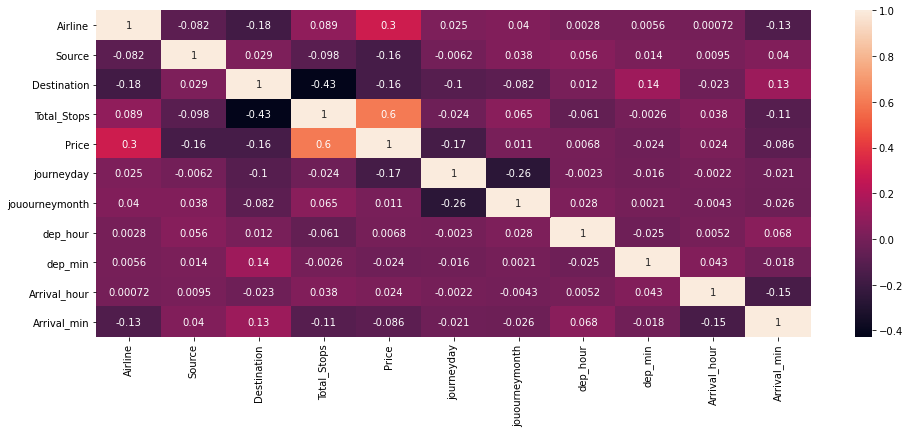

In [113]:
plt.figure(figsize=(16, 6))
sns.heatmap(traindata.corr(), annot=True)
plt.show()

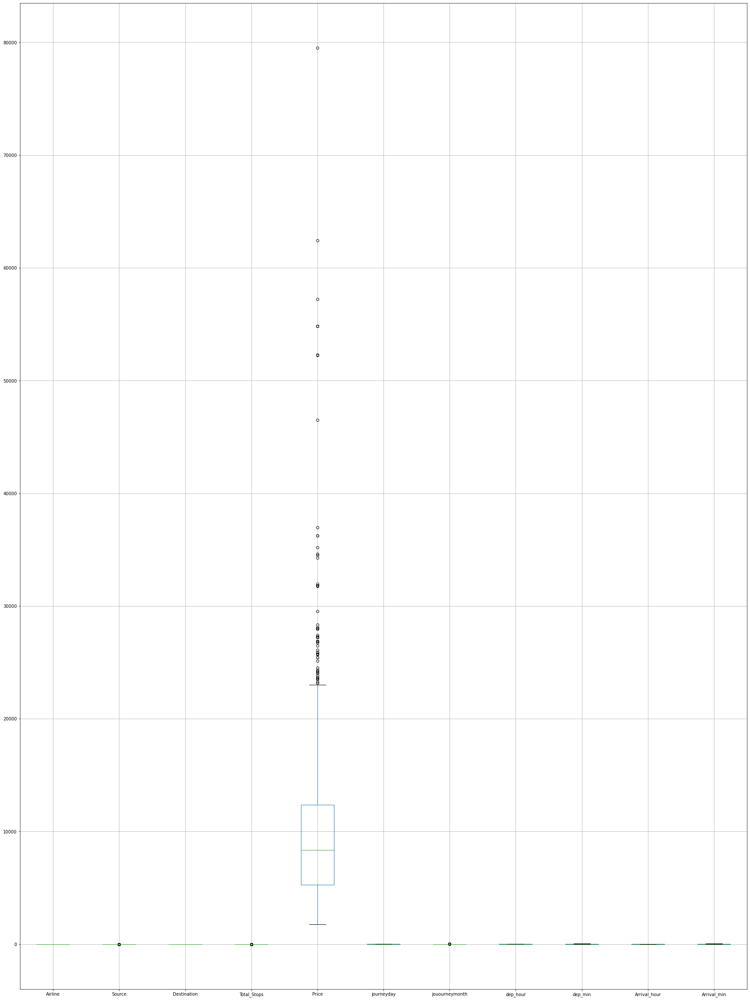

In [167]:
# plotting boxplot to identify outliers
traindata.boxplot(figsize=[30,50])
plt.subplots_adjust(bottom=0.25)
plt.show()

In [170]:
#removing data of outliers
q=traindata['Price'].quantile(0.93)
data_cleaned =traindata[traindata['Price']<q]

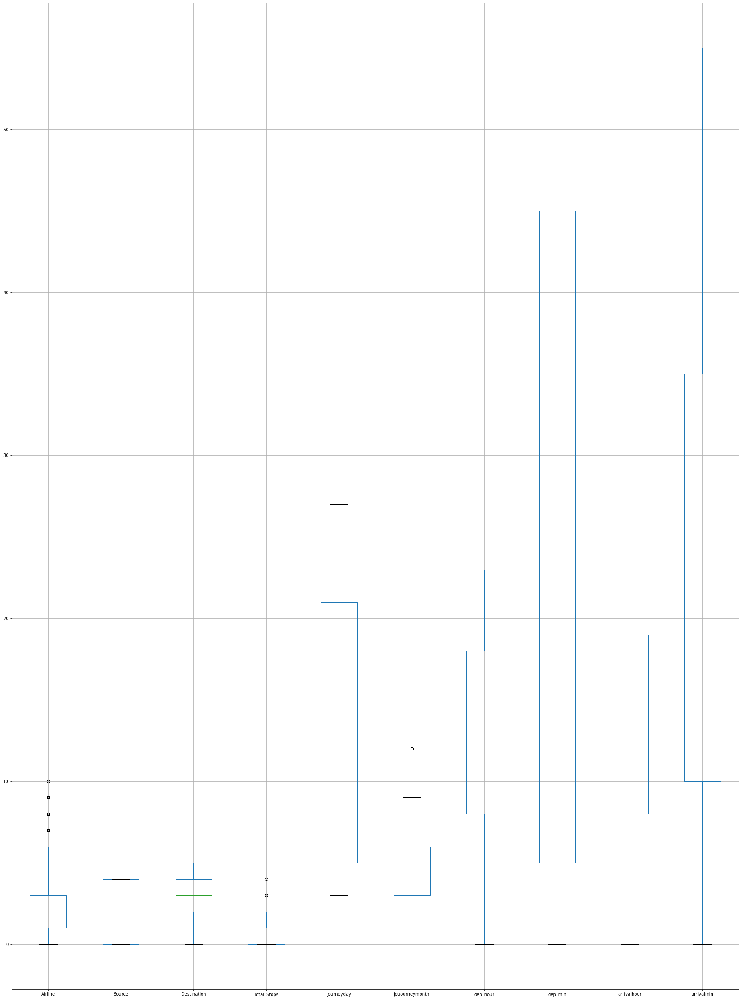

In [168]:
# plotting boxplot to identify outliers
testdata.boxplot(figsize=[30,50])
plt.subplots_adjust(bottom=0.25)
plt.show()

In [171]:
#removing data of outliers
q=testdata['Airline'].quantile(0.93)
data_cleaned =testdata[testdata['Airline']<q]

In [172]:
#removing data of outliers
q=testdata['Total_Stops'].quantile(0.93)
data_cleaned =testdata[testdata['Total_Stops']<q]


In [177]:
# checking for skewed data 
traindata.skew()

Airline          -0.261966
Source            0.684342
Destination       1.188222
Total_Stops       0.317109
Price             1.812405
journeyday        0.367212
jouourneymonth    0.629556
dep_hour          0.112924
dep_min           0.167234
Arrival_hour     -0.370146
Arrival_min       0.110945
dtype: float64

In [181]:
#removing skewness
from sklearn.preprocessing import power_transform
df_new=power_transform(traindata)

df_new=pd.DataFrame(df_new,columns=traindata.columns)

In [182]:
df_new.skew()

Airline          -0.237160
Source           -0.027322
Destination       0.172468
Total_Stops      -0.059185
Price            -0.012108
journeyday        0.016927
jouourneymonth   -0.026460
dep_hour         -0.104258
dep_min          -0.359497
Arrival_hour     -0.356878
Arrival_min      -0.347628
dtype: float64

In [178]:
# checking for skewed data 
testdata.skew()

Airline           0.959713
Source            0.545843
Destination      -0.545176
Total_Stops       0.321364
journeyday        0.478246
jouourneymonth    0.590701
dep_hour          0.093759
dep_min           0.128515
arrivalhour      -0.443166
arrivalmin        0.115267
dtype: float64

In [179]:
#removing skewness
from sklearn.preprocessing import power_transform
df_new=power_transform(testdata)

df_new=pd.DataFrame(df_new,columns=testdata.columns)

In [180]:
df_new.skew()

Airline          -0.020389
Source            0.133788
Destination      -0.337791
Total_Stops      -0.059179
journeyday        0.061335
jouourneymonth   -0.032442
dep_hour         -0.106211
dep_min          -0.373547
arrivalhour      -0.408083
arrivalmin       -0.353897
dtype: float64

In [183]:
array = traindata.values
X = array[:, 0:10]
Y = array[:, 8]

In [184]:
from sklearn.preprocessing import Normalizer

nz = Normalizer()
rescaled_X = nz.fit_transform(X)
test_rescaled_X = nz.transform(testdata)
rescaled_X

array([[1.02637953e-03, 0.00000000e+00, 1.28297441e-03, ...,
        5.64508741e-03, 5.13189764e-03, 2.56594882e-04],
       [3.91533548e-04, 2.61022365e-04, 1.30511183e-04, ...,
        6.52555913e-04, 6.52555913e-03, 1.69664537e-03],
       [6.48320012e-04, 7.20355568e-05, 0.00000000e+00, ...,
        6.48320012e-04, 1.80088892e-03, 2.88142227e-04],
       ...,
       [1.24496862e-03, 0.00000000e+00, 2.76659693e-04, ...,
        1.10663877e-03, 2.76659693e-03, 1.52162831e-03],
       [6.32508467e-04, 0.00000000e+00, 3.95317792e-04, ...,
        8.69699143e-04, 2.37190675e-03, 1.10688982e-03],
       [2.55250646e-04, 8.50835487e-05, 0.00000000e+00, ...,
        8.50835487e-04, 4.67959518e-03, 1.61658742e-03]])

In [185]:
from sklearn.model_selection import train_test_split

x_train, x_valid, y_train, y_valid = train_test_split(rescaled_X, Y, test_size=0.20, random_state=1)

In [186]:
#agorithm use to predict the model
from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression()
log_reg.fit(x_train,y_train)

LogisticRegression()

In [187]:
y_pred=log_reg.predict(x_valid)

In [188]:
accuracy=accuracy_score(y_valid,y_pred)
accuracy

0.19045390734674777

In [189]:
#agorithm use to predict the model
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(x_train,y_train)
predrf = rf.predict(x_valid)

In [190]:
print(accuracy_score(y_valid,predrf))

0.9541413196069256


In [191]:
print(confusion_matrix(y_valid,predrf))

[[407   0   0   0   0   0   0   0   0   0   0   0]
 [  0 149   0   0   0   0   0   0   0   0   0   0]
 [  0   2 174   1   1   0   0   0   0   0   0   0]
 [  0   0   1 149   1   0   0   0   0   0   0   0]
 [  0   0   0   4 129   3   0   0   0   0   0   0]
 [  0   0   0   0   1 125   5   0   0   0   0   0]
 [  0   0   0   0   2   0 240   4   1   0   0   0]
 [  0   0   0   0   0   1   8 116   4   1   0   0]
 [  0   0   0   0   0   0   7   0  94   5   2   1]
 [  0   0   0   0   0   0   0   0   4 146   7   4]
 [  0   0   0   0   0   0   1   0   2  10  98   7]
 [  0   0   0   0   0   0   0   0   2   3   3 212]]


In [192]:
print(classification_report(y_valid,predrf))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       407
         5.0       0.99      1.00      0.99       149
        10.0       0.99      0.98      0.99       178
        15.0       0.97      0.99      0.98       151
        20.0       0.96      0.95      0.96       136
        25.0       0.97      0.95      0.96       131
        30.0       0.92      0.97      0.94       247
        35.0       0.97      0.89      0.93       130
        40.0       0.88      0.86      0.87       109
        45.0       0.88      0.91      0.90       161
        50.0       0.89      0.83      0.86       118
        55.0       0.95      0.96      0.95       220

    accuracy                           0.95      2137
   macro avg       0.95      0.94      0.94      2137
weighted avg       0.95      0.95      0.95      2137



In [193]:
#using dtc algoritm
from sklearn.tree import DecisionTreeClassifier
clf=DecisionTreeClassifier()
clf.fit(x_train,y_train)

DecisionTreeClassifier()

In [194]:
clf.score(x_train,y_train)

1.0

In [195]:
y_pred=clf.predict(x_valid)

In [196]:
clf.score(x_valid,y_valid)

0.9410388394946186

In [197]:
# using support vector regression
from sklearn.svm import SVR
svr=SVR()
svr.fit(x_train,y_train)
ad_pred = svr.predict(x_valid)

In [198]:
#accuracy score
print(accuracy_score(y_valid,predrf))

0.9541413196069256


In [199]:
#use of matrix
print(confusion_matrix(y_valid,predrf))

[[407   0   0   0   0   0   0   0   0   0   0   0]
 [  0 149   0   0   0   0   0   0   0   0   0   0]
 [  0   2 174   1   1   0   0   0   0   0   0   0]
 [  0   0   1 149   1   0   0   0   0   0   0   0]
 [  0   0   0   4 129   3   0   0   0   0   0   0]
 [  0   0   0   0   1 125   5   0   0   0   0   0]
 [  0   0   0   0   2   0 240   4   1   0   0   0]
 [  0   0   0   0   0   1   8 116   4   1   0   0]
 [  0   0   0   0   0   0   7   0  94   5   2   1]
 [  0   0   0   0   0   0   0   0   4 146   7   4]
 [  0   0   0   0   0   0   1   0   2  10  98   7]
 [  0   0   0   0   0   0   0   0   2   3   3 212]]


In [200]:
#cross validation score
from sklearn.model_selection import cross_val_score
scr = cross_val_score(log_reg,x_valid,y_valid,cv=5)
print(scr.mean())

0.1904528442294644


In [201]:
#calculating crosss validation score
from sklearn.model_selection import cross_val_score
scr = cross_val_score(clf,x_valid,y_valid,cv=5)
print(scr.mean())

0.8001761912057607


In [202]:
#calculating crosss validation score
from sklearn.model_selection import cross_val_score
scr = cross_val_score(rf,x_valid,y_valid,cv=5)
print(scr.mean())

0.8399516294950644


In [203]:
#k nearest neighbour algorithm
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(
n_neighbors = 22, 
metric = 'minkowski', p = 2)
classifier.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=22)

In [204]:
y_pred  = classifier.predict(x_valid)

In [205]:
acc = accuracy_score(y_valid, y_pred )

In [206]:
print(accuracy_score(y_valid,predrf))

0.9541413196069256


In [207]:
#calculating crosss validation score
from sklearn.model_selection import cross_val_score
scr = cross_val_score(classifier,x_valid,y_valid,cv=5)
print(scr.mean())

0.5264429074832017


In [208]:
#probability
probes = rf.predict_proba(x_valid)

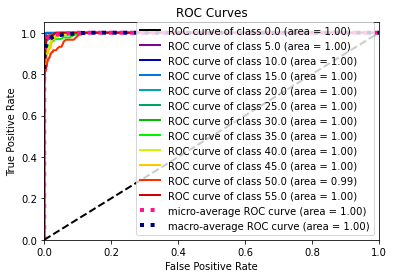

In [209]:
#roc curve
import scikitplot as skplt
skplt.metrics.plot_roc(y_valid,probes)
plt.show()

In [210]:
#implementing lasso regression
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso
lasso = Lasso()

In [211]:
parameters = {"alpha":[15, 14, 35, 40, 13, 24, 17, 50, 11, 20]}
lasso_regression = GridSearchCV(lasso, parameters, scoring='neg_mean_squared_error', cv=5)
lasso_regression.fit(x_valid, y_valid)

GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [15, 14, 35, 40, 13, 24, 17, 50, 11, 20]},
             scoring='neg_mean_squared_error')

In [212]:
print(lasso_regression.best_params_)

{'alpha': 15}


In [213]:
print(lasso_regression.best_score_)

-351.8776921124251


In [214]:
# saving the model
import pickle

from sklearn import model_selection
filename = 'flight.sav'
pickle.dump(traindata, open(filename, 'wb'))